# This jupyter notebook is used to do exploratory data analysis (EDA) for capstone 1 

The following steps are just repeated from steps of data wrangling. If you have any questions/concerns, please review here: <br>
https://github.com/jiaqixu/Springboard/blob/master/Capstone/Capstone1/data_wrangling_capstone1.ipynb

In [1]:
import os 
import pandas as pd
from datetime import datetime,date
from calendar import monthrange
import numpy as np
import math
from matplotlib import style
import matplotlib.pyplot as plt
from random import sample
from scipy import stats
import warnings
%matplotlib inline


#os.getcwd()
#deprecate runtime warning
warnings.filterwarnings("ignore", category=RuntimeWarning) 
warnings.simplefilter(action='ignore', category=FutureWarning)
prefix_market = 'sp500'
#prefix_market = 'FTSE100'
base_os = 'G:\Data\Machine_Learning_Library\spring_board_data_science\Capstone\Capstone1\data'
#os1 = os.path.join(base_os, prefix_market,'cleaned_data')
#os2 = os.path.join(base_os, prefix_market,'download_data_revise')
start_date = '2005-01-01'
end_date = '2020-01-01'
##load all data
filename = prefix_market + "_matrix_utd.csv"
origdat_matrix = pd.read_csv(os.path.join(base_os,filename),sep=",",index_col='symbol')
origdat_matrix.columns = origdat_matrix.columns.astype('datetime64[ns]')
print("The size of \"{}\" is: {}".format(filename, origdat_matrix.shape))

## define function to remove extreme price, for price of stocks above 5000 (this is data download problem)
def rm_extreme_price(dat, threshold_price = 5000):
    ##clean origdat
    tmp = dat.apply(lambda x:sum(x>threshold_price),axis=0)
    rm_list = []
    for i in range(tmp.shape[0]):
        if tmp[i]>0:
            rm_list.append(tmp.index[i])
    print("remove stocks:",rm_list)
    keep_list = [item for item in dat.columns if item not in rm_list]
    return(dat[keep_list])
    

filename = prefix_market + "_all_download_data_01-01-2005_12-31-2019_Adj Close.csv"
origdat = pd.read_csv(os.path.join(base_os,filename),sep=",",index_col='date',parse_dates = True)
origdat = rm_extreme_price(origdat)
print("The size of \"{}\" is: {}".format(filename, origdat.shape))

filename = prefix_market + "_all_download_data_01-01-2005_12-31-2019_Adj Open.csv"
origdat_o = pd.read_csv(os.path.join(base_os,filename),sep=",",index_col='date',parse_dates = True)
origdat_o = rm_extreme_price(origdat_o)
print("The size of \"{}\" is: {}".format(filename, origdat_o.shape))

filename = prefix_market + "_all_download_data_01-01-2005_12-31-2019_Volume.csv"
origdat_v = pd.read_csv(os.path.join(base_os,filename),sep=",",index_col='date',parse_dates = True)
print("The size of \"{}\" is: {}".format(filename, origdat_v.shape))

#prefix_market='sp500'
filename = prefix_market + "_index_data_01-01-2000_05-20-2020.csv"
sp500 =  pd.read_csv(os.path.join(base_os,filename),sep=",",index_col='date',parse_dates = True)
print("The size of \"{}\" is: {}".format(filename, sp500.shape))


sp500 = pd.DataFrame(sp500['Close'])
sp500.columns = ['SP500']
#sp500.head()
origdat = origdat.merge(sp500, how = 'left', left_index=True, right_index=True)
#origdat.head()

origdat_ret = origdat.pct_change()
origdat_ret = origdat_ret[1:]
#origdat_ret = origdat
print("The size of return is:{}".format(origdat_ret.shape))
#origdat_ret.head()


##define set periods for train and trade
def add_months(sourcedate, months):
    month = sourcedate.month - 1 + months
    year = sourcedate.year + month // 12
    month = month % 12 + 1
    day = min(sourcedate.day, monthrange(year,month)[1])
    return date(year, month, day)

def diff_month(d1, d2):
    return -((d1.year - d2.year) * 12 + d1.month - d2.month)

def add_years(sourcedate, years):
    month = sourcedate.month
    year = sourcedate.year+years
    day = sourcedate.day
    return date(year, month, day)

def diff_year(d1,d2):
    return -((d1.year-d2.year))


#set for training periods
first_period1 = [datetime.strptime(item,'%Y-%m-%d') for item in ['2005-01-01', '2008-01-01', '2009-01-01']]
nrows1 = diff_year(datetime.strptime('2009-01-01','%Y-%m-%d'),datetime.strptime('2020-01-01','%Y-%m-%d'))+1
periods1=[]
for i in range(nrows1):
    periods1.append(list(map(lambda period: add_years(period,i), first_period1)))
    
periods1 = pd.DataFrame(periods1)
periods1.columns = ['train_start','trad_start','trad_end']
periods1 = periods1.apply(pd.to_datetime)
#print("Head of periods are:\n",periods1.head(),"\n")
#print("Tail of periods are:\n",periods1.tail(),"\n")

print("There are total {} training and trading sets.".format(periods1.shape[0]))
# define data check 
def data_quality(nrows,periods):
    add_symbol = "SP500"
    set_dict1 = {}
    for i in range(nrows):
        #choose date in periods1[i][1]
        sel_date0 = periods.iloc[i][0]
        sel_date = periods.iloc[i][1]
        
        ###move 1 year head since sub training stop 
        #sel_date = sel_date.replace(year = sel_date.year - 1)
        #print(sel_date)
        sel_stocks = origdat_matrix.index[origdat_matrix[sel_date]==1]
        #stocks should be the intersections of columnames of origdat_ret and set_stocks
        sel_list = list(set(origdat_ret.columns).intersection(set(sel_stocks)))
        sel_list.append(add_symbol)
        set_dat = origdat_ret[sel_list]
        # set in the date
        set_dat = set_dat[periods.iloc[i][0]:periods.iloc[i][1]]
        ##check the missing values
        keep_columns = []
        for item in set_dat.columns:
            if set_dat[item].isna().sum()/set_dat.shape[0]<=0.1:
                keep_columns.append(item)
        ##assert add_symbol must in keep_columns
        if add_symbol not in keep_columns:
            keep_columns.append(add_symbol)
        set_dat = set_dat[list(set(set_dat.columns).intersection(set(keep_columns)))]
        set_dict1[sel_date0] = sorted(set_dat.columns)
    
        #print("For period {}, there are total {} be selected!".format(sel_date,set_dat.shape[1]))
    return set_dict1
#set_dict1
set_dict1 = data_quality(nrows1,periods1) 

def dict_summ(set_dict):
    period_st = []
    num_stock = []
    for keys, value in set_dict.items():
        period_st.append(keys)
        num_stock.append(len(value))

    dict_summ = pd.DataFrame([period_st,num_stock]).T
    dict_summ.columns = ['start_time','num_stocks']
    return dict_summ

The size of "sp500_matrix_utd.csv" is: (711, 145)
remove stocks: ['TIE', 'BMC', 'PCL', 'POM', 'GAS', 'EMC', 'HOT', 'HAR', 'CHK', 'SCG']
The size of "sp500_all_download_data_01-01-2005_12-31-2019_Adj Close.csv" is: (3774, 626)
remove stocks: ['TIE', 'BMC', 'PCL', 'POM', 'GAS', 'EMC', 'HOT', 'HAR', 'CHK', 'SCG']
The size of "sp500_all_download_data_01-01-2005_12-31-2019_Adj Open.csv" is: (3774, 626)
The size of "sp500_all_download_data_01-01-2005_12-31-2019_Volume.csv" is: (3774, 636)
The size of "sp500_index_data_01-01-2000_05-20-2020.csv" is: (5128, 5)
The size of return is:(3773, 627)
There are total 12 training and trading sets.


Plot number of stocks used in each periods from year 2005 to 2010

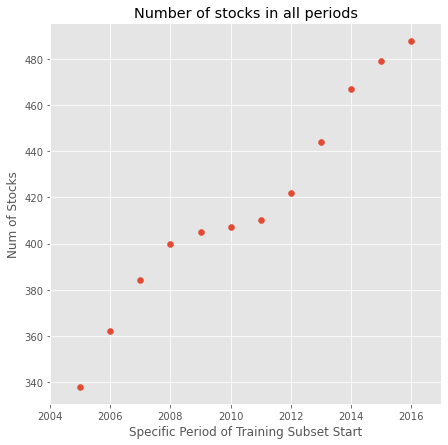

In [2]:
plt.style.use("ggplot")
fig = plt.figure(figsize=(7,7))
dict_summ1 = dict_summ(set_dict1)
#dict_summ2 = dict_summ(set_dict2)
#dict_summ3 = dict_summ(set_dict3)
#fig, ax = plt.subplots()
#bins = np.linspace(330, 505,30)
plt.scatter(list(set_dict1.keys()),dict_summ1['num_stocks'])
#plt.xlim(2005,2020)
#plt.hist(dict_summ2['num_stocks'],bins, label= "valid")
#plt.hist(dict_summ3['num_stocks'],bins, label= "test")
#plt.legend(loc='upper left')
plt.xlim(pd.Timestamp('2004-01-01'), pd.Timestamp('2017-01-01'))
plt.xlabel("Specific Period of Training Subset Start")
plt.ylabel("Num of Stocks")
plt.title("Number of stocks in all periods")
plt.show()

From above plot, we find that from period for training subset (2005 to 2016), the number of stocks increases from 340 to 500, this is because Yahoo Finance will remove the delisted stocks in the system, for earlier time period, we will have less information about stocks. Although at begining, we only have 340 stocks (expected 500), our size of the data after feature created will be (340*500)*31, that is around 170,000*31 for classification, so the results will not be affected to much.

For EDA, we first plot return of sp500 index because it will be our benchmark, we will also check the normality of the data

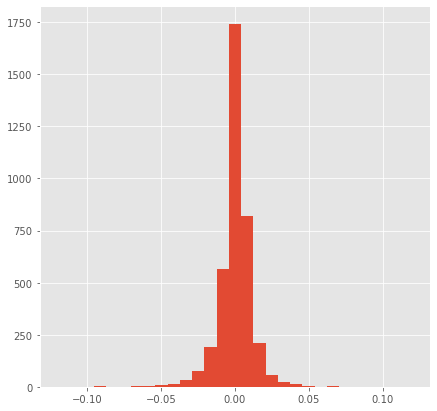

count    3773.000000
mean        0.000329
std         0.011590
min        -0.090350
25%        -0.003839
50%         0.000685
75%         0.005353
max         0.115800
Name: SP500, dtype: float64

In [3]:
fig = plt.figure(figsize=(7,7))
bins = np.linspace(-0.12, 0.12,30)
plt.hist(origdat_ret['SP500'],bins)
#axs[1].yaxis.set_major_formatter(PercentFormatter(xmax=1))
plt.show()
origdat_ret['SP500'].describe()

In [4]:
def check_normal(dat):
    k2, p = stats.normaltest(dat)
    alpha = 1e-3
    print("p = {:g}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected")
    else:
        print("The null hypothesis cannot be rejected")

check_normal(origdat_ret['SP500'])

p = 4.92038e-164
The null hypothesis can be rejected


Since null hypothesis can be rejected, so we conclude the return of SP500 is not normally distributed. From the summary of SP500's return, we find the mean of daily return is 0.0329% with range from -9.035% to 11.58%

We randomly pick up 5 stocks and see the shape of the return

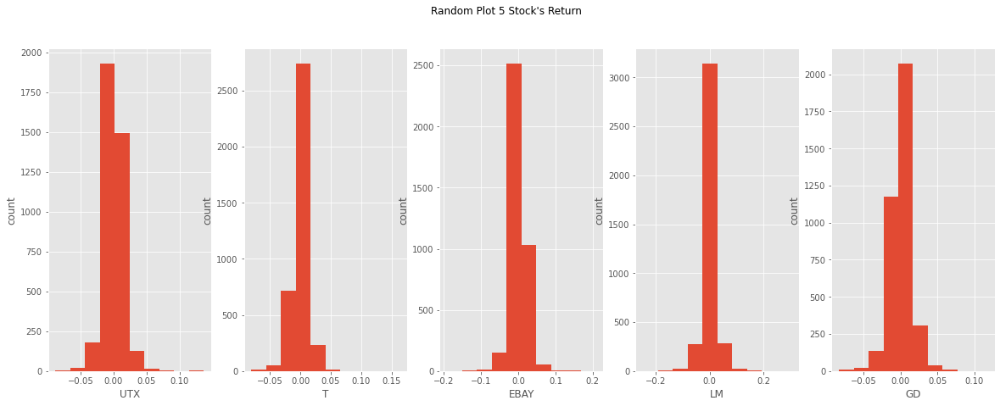

In [5]:
sequence = [i for i in range(origdat_ret.shape[1]-1)]
subset = sample(sequence, 5)
plt.style.use("ggplot")
#fig = plt.figure(figsize=(10,30))
fig, ax= plt.subplots(1, 5,figsize=(20,7))
fig.suptitle("Random Plot 5 Stock's Return")
for i in range(5):
    ax[i].hist(origdat_ret.iloc[:,subset[i]],histtype='bar')
    ax[i].set_xlabel(origdat_ret.columns[subset[i]])
    ax[i].set_ylabel("count")
plt.show()

Check normality

In [6]:
for i in range(5):
    print("For stock {}".format(origdat_ret.columns[subset[i]]))
    check_normal(origdat_ret.iloc[:,subset[i]])

For stock UTX
p = 6.46388e-138
The null hypothesis can be rejected
For stock T
p = 1.19296e-200
The null hypothesis can be rejected
For stock EBAY
p = 1.11258e-155
The null hypothesis can be rejected
For stock LM
p = 1.10391e-185
The null hypothesis can be rejected
For stock GD
p = 1.16808e-86
The null hypothesis can be rejected


From above results, we reject the nomality of all randomly picked stocks. We also find the returns of these stocks are different.

**Since there are 12 periods, so there will be 12 sample dataset as train and trade, we pick up one as an example for EDA** <br>

In [7]:
train_ind = 10
cur_key = set_dict1[periods1.iloc[train_ind,0]]
start_date = periods1.iloc[train_ind,0]
end_date = periods1.iloc[train_ind,1]

cur_dat = origdat.loc[start_date:end_date,cur_key]
#cur_dat.fillna(method = 'ffill',inplace=True)
#fill na by 'ffill' method
cur_dat.fillna(method = 'ffill',inplace=True)
print(cur_dat.iloc[:5,:5])

                A    AAL     AAP    AAPL   ABBV
date                                           
2015-01-02  38.55  51.08  156.79  100.22  51.72
2015-01-05  37.83  51.05  154.73   97.39  50.74
2015-01-06  37.24  50.26  154.62   97.40  50.49
2015-01-07  37.74  50.23  157.94   98.77  52.53
2015-01-08  38.87  50.84  159.32  102.56  53.08


We will build features as lag returns of days {1,2,...,20},{40,60,...,240}, so we set m as these days

In [8]:
m = list(range(1,21))
for k in range(2,13):
    m.append(k*20)
print(m)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]


Define functions to create features:<br>
- lag_return: calculate lag of return
- future_return: calculate future of return
- create_feature_once: for the specific day, create features for all stocks
- create target_once: for the sepecific day, create target for all stocks (recall if target=1 represents the future return of a stock is greater than the corresponding cross-sectional median return computed over all stocks and zero otherwise 
- create_feature_all: for all days in the training (or trading), create features for all stocks
- create_target_all: for all days in the training (or trading), create targets for all stocks

In [9]:
def lag_return(dat,start_row,lag):
    return dat[start_row]/dat[start_row-lag]-1

def future_return(dat,start_row,fut):
    return dat[start_row+fut]/dat[start_row]-1


def create_feature_once(dat, start_ind, sel_feat):
    df = pd.DataFrame()
    #for i in range(len(sel_feat)):
    for ind in sel_feat:
        #print(ind)
        feat_ind = dat.apply(lag_return,args=(start_ind,ind),axis=0)
        feat_ind = feat_ind.to_frame()
        feat_ind = feat_ind.rename(columns={0:'f'+str(ind)})
        df = pd.concat([df,feat_ind],axis=1)
    return df

def create_target_once(dat,start_ind,sel_fut):
    target = dat.apply(future_return,args=(start_ind,sel_fut),axis=0)
    set_median = target.median()
    target = target.apply(lambda x:1 if x>set_median else 0)
    #target = target.to_frame()
    #target = target.rename(columns={0:'tar'+str(start_ind)})
    return(target)


def create_target_once2(dat,start_ind,sel_fut):
    target = dat.apply(future_return,args=(start_ind,sel_fut),axis=0)
    set_median = target.median()
    target = target.apply(lambda x:1 if x>0 else 0)
    #target = target.to_frame()
    #target = target.rename(columns={0:'tar'+str(start_ind)})
    return(target)

def create_feature_all(dat, sel_feat):
    print("create features for training data.")
    df = pd.DataFrame()
    total_dat = dat.shape[0]
    end_ind = total_dat - 1
    ind = max(sel_feat)
    #n =0 
    while ind<=end_ind-1:
        if ind%40==0:
            print(ind, end = " ")
        df_feat = create_feature_once(dat,start_ind= ind, sel_feat=sel_feat)
        #if n==0:
            #df_feat = create_feature_once(cur_dat,start_ind= ind, sel_feat=m)
        #    df = df_feat
        #else:
        df = pd.concat([df,df_feat],axis=0)
        #    df = np.hstack([df,df_feat])
        ind = ind + 1
    print("\n")
    return(df)

def create_target_all(dat,sel_fut,sel_feat):
    print("create classification for target data.")
    df = pd.DataFrame()
    total_dat = dat.shape[0]
    end_ind = total_dat - 1
    ind = max(sel_feat)
    while ind<=end_ind-sel_fut:
        if ind%40==0:
            print(ind, end = " ")
        df_target = create_target_once(dat,start_ind= ind, sel_fut=sel_fut)
        #df_target = create_target_once2(cur_dat,start_ind= ind, sel_fut=sel_fut)
        df = pd.concat([df,df_target],axis=0)
        ind = ind + 1
    print("\n")
    return(df)

In [10]:
df_feat = create_feature_all(dat = cur_dat, sel_feat=m)
#print(df_feat.head(5))
print("The size of train data set is:", df_feat.shape)
print("The head of train data set is:\n")
print(df_feat.head(5))

df_target = create_target_all(cur_dat,sel_fut=1,sel_feat=m)
print("The size of target data set is:", df_target.shape)
print("The head of target data set is:\n")
print(df_target.head(5))

create features for training data.
240 280 320 360 400 440 480 520 560 600 640 680 720 

The size of train data set is: (246206, 31)
The head of train data set is:

            f1        f2        f3        f4        f5        f6        f7  \
A     0.014004  0.015584 -0.010628 -0.004075 -0.008621  0.002821 -0.007110   
AAL   0.019790  0.012183 -0.033705 -0.023975 -0.043693 -0.069486 -0.052815   
AAP   0.057962  0.049131  0.029020  0.019318  0.041919  0.032732  0.002139   
AAPL -0.017643 -0.023694 -0.048846 -0.044345 -0.065415 -0.065838 -0.071731   
ABBV  0.017130  0.043597  0.011057  0.006605 -0.004789  0.002192 -0.013805   

            f8        f9       f10  ...       f60       f80      f100  \
A     0.016376  0.009814 -0.006101  ...  0.146964  0.129731  0.041278   
AAL  -0.015478 -0.027937 -0.015239  ... -0.012373  0.073859  0.079841   
AAP   0.008941 -0.011130 -0.038019  ... -0.106358 -0.120091 -0.071806   
AAPL -0.040875 -0.049723 -0.058323  ... -0.036840  0.049195 -0.104650   
A

Check the info of df_feat and df_target

In [11]:
print(df_feat.info())
print(df_target.info())

<class 'pandas.core.frame.DataFrame'>
Index: 246206 entries, A to ZTS
Data columns (total 31 columns):
f1      246206 non-null float64
f2      246206 non-null float64
f3      246206 non-null float64
f4      246206 non-null float64
f5      246206 non-null float64
f6      246206 non-null float64
f7      246206 non-null float64
f8      246206 non-null float64
f9      246206 non-null float64
f10     246206 non-null float64
f11     246206 non-null float64
f12     246206 non-null float64
f13     246206 non-null float64
f14     246206 non-null float64
f15     246206 non-null float64
f16     246206 non-null float64
f17     246206 non-null float64
f18     246206 non-null float64
f19     246206 non-null float64
f20     246206 non-null float64
f40     246206 non-null float64
f60     246206 non-null float64
f80     246206 non-null float64
f100    246206 non-null float64
f120    246206 non-null float64
f140    246206 non-null float64
f160    246206 non-null float64
f180    246206 non-null float64
f

There are no missing values for dataset df_feat and df_target, the records for the are 246206.

In [12]:
df_feat.describe()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f60,f80,f100,f120,f140,f160,f180,f200,f220,f240
count,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,...,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000,246206.000000
mean,0.000736,0.001465,0.002154,0.002844,0.003517,0.004173,0.004812,0.005492,0.006128,0.006717,...,0.037264,0.049135,0.057951,0.068037,0.077398,0.086006,0.094338,0.102901,0.112140,0.121080
std,0.016188,0.022845,0.027872,0.032098,0.035817,0.039197,0.042294,0.045210,0.047940,0.050469,...,0.122005,0.139415,0.156773,0.175990,0.193777,0.209405,0.225548,0.243281,0.262077,0.277187
min,-0.348187,-0.405238,-0.393961,-0.403181,-0.428098,-0.483063,-0.481281,-0.470322,-0.453797,-0.464497,...,-0.699834,-0.724105,-0.734134,-0.788998,-0.817079,-0.813402,-0.834173,-0.805376,-0.821499,-0.796049
25%,-0.006225,-0.008633,-0.010552,-0.012092,-0.013327,-0.014580,-0.015730,-0.016685,-0.017607,-0.018425,...,-0.032971,-0.031566,-0.033891,-0.036586,-0.037152,-0.036362,-0.036075,-0.037877,-0.039403,-0.040186
50%,0.000814,0.001566,0.002284,0.002935,0.003605,0.004254,0.004774,0.005435,0.006065,0.006672,...,0.038835,0.048957,0.056359,0.066591,0.075783,0.084173,0.089590,0.095426,0.102324,0.110113
75%,0.007978,0.011824,0.015060,0.018001,0.020714,0.023264,0.025606,0.027888,0.030071,0.032097,...,0.104835,0.124568,0.142473,0.163457,0.182233,0.197271,0.212206,0.224982,0.240268,0.253451
max,0.522901,0.536538,0.550168,0.581657,0.594485,0.622363,0.600365,0.603609,0.589110,0.644550,...,2.136126,1.921466,2.008287,2.612022,3.103825,2.800000,3.362595,4.202290,5.595628,5.747525


pairwise plot of df_feat

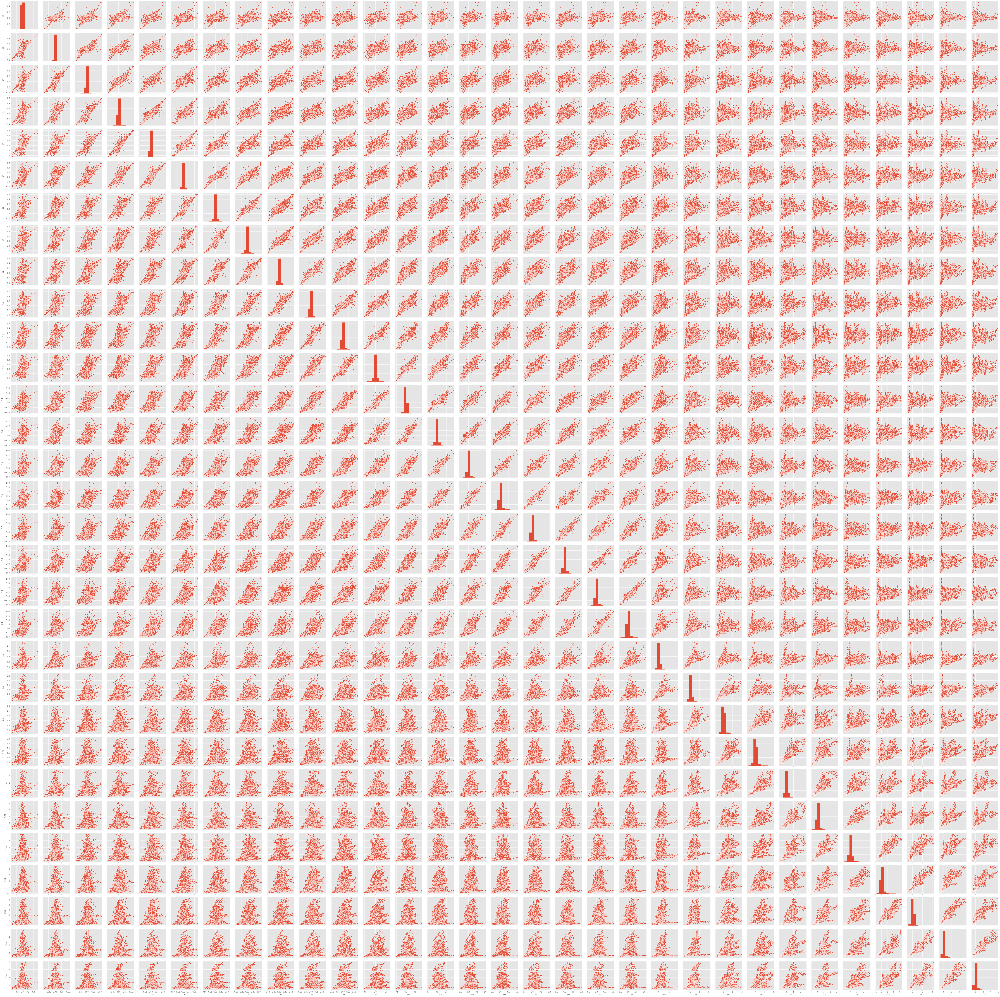

In [13]:
import seaborn as sns
sns.pairplot(df_feat,palette='Set1')
plt.show()

Visualize Relationships between Variables <br>
Use a Correlation Matrix to look at the relationships between all created features for all stocks.

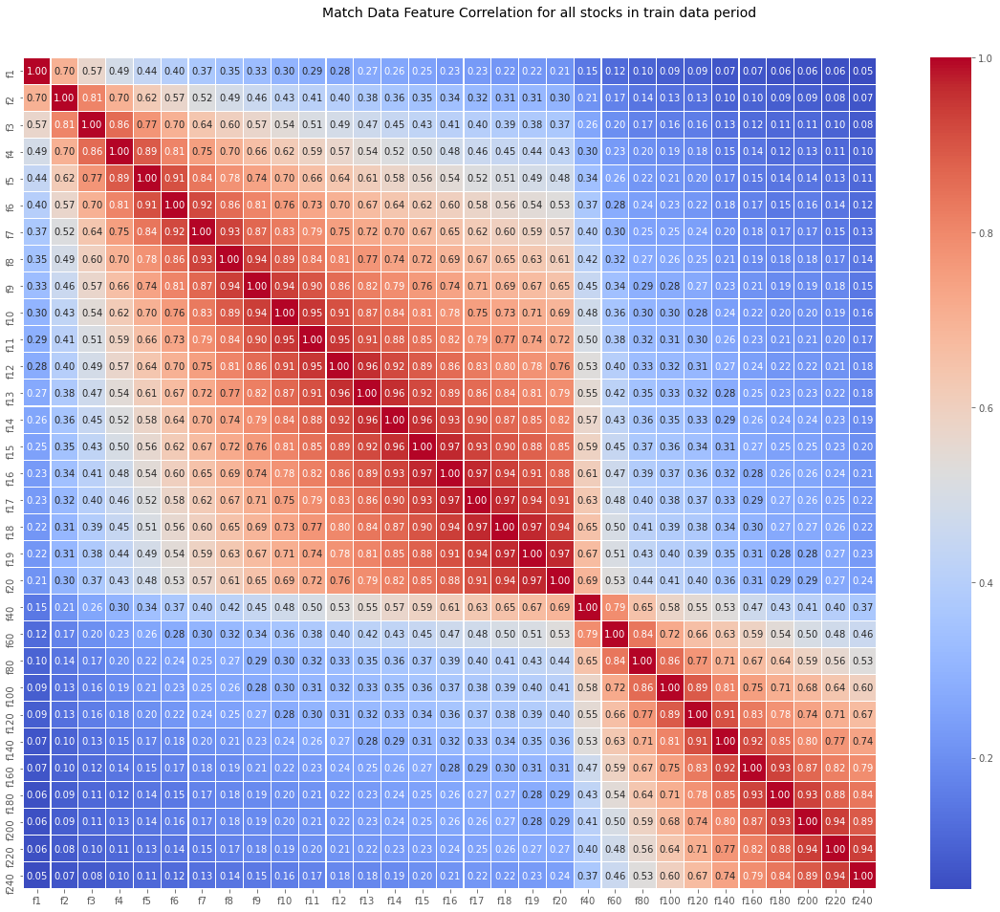

In [14]:
#import seaborn as sns
f, ax = plt.subplots(figsize=(20, 15))
df_corr = df_feat.corr()
hm = sns.heatmap(round(df_corr,2),annot = True, ax=ax, cmap='coolwarm',fmt='.2f',linewidths=.05)

#plt.figure(figsize=(20,15))
#ax = sns.heatmap(df_corr, annot=True)


#hm = sns.heatmap(round(corrmat,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
#                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Match Data Feature Correlation for all stocks in train data period', fontsize=14)

Visualize Notable Correlations

From heatmap, there is a strong correlation between two nearby features (such as f2 and f3, f3 and f4...).
Let's check them case by case with several examples

strong correlation f2 vs f3 (0.81)

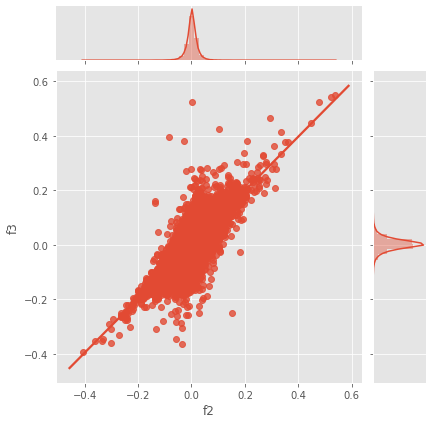

In [15]:
sns.jointplot(x='f2', y='f3', data=df_feat, kind="reg")

Strong correlation f6 vs f7 (0.92)

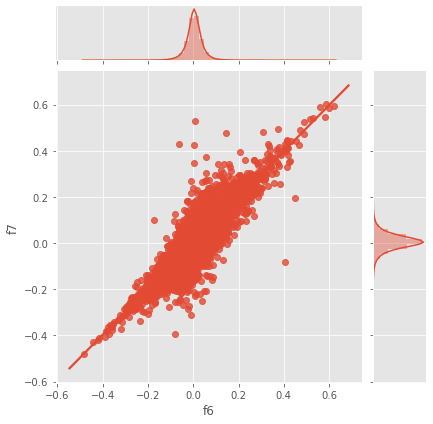

In [16]:
sns.jointplot(x='f6', y='f7', data=df_feat, kind="reg")

Strong correlation f8 and f9 (0.94)

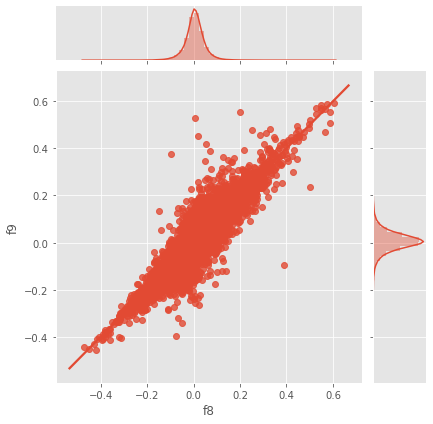

In [17]:
sns.jointplot(x='f8', y='f9', data=df_feat, kind="reg")

Strong correlation f200 and f220 (0.94)

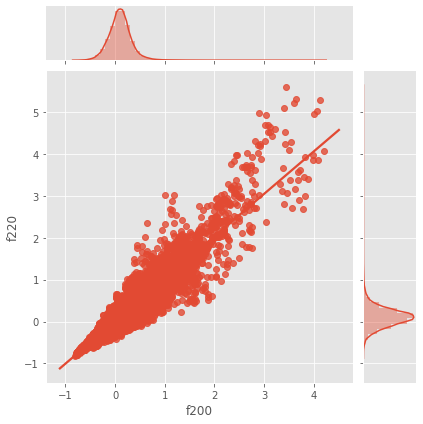

In [18]:
sns.jointplot(x='f200', y='f220', data=df_feat, kind="reg")

Strong correlation f220 and f240 (0.94)

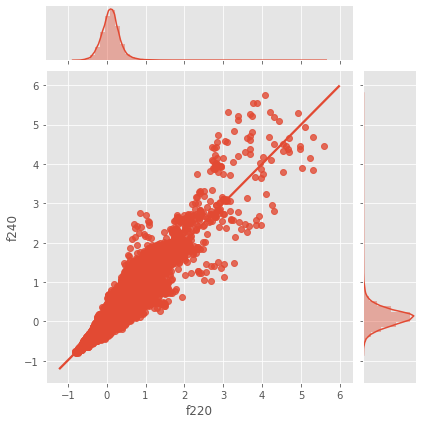

In [19]:
sns.jointplot(x='f220', y='f240', data=df_feat, kind="reg")

I am not surprised with a strong correlation between two nearby features, since the stock's returns are multivarite time series. After look at above plot, you may find in 1 lag of nearby feature's joint plot, the scatter points are distributed around linear regression lines uniformly while in 20 lags of nearby feature's joint plot, the scatter points are not distributed uniformly around liner regression lines on the right upper corner.<br>
We will keep all created features since this process follows Krauss (2017).